# Import

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import fastai
from fastai.imports import *
from fastai.basics import *
from fastai.metrics import accuracy
from fastai.torch_core import *
from fastai.vision import *
fastai.__version__

'1.0.51'

In [6]:
from fastai_audio import *

# Data

Download https://goo.gl/8hY5ER

website https://urbansounddataset.weebly.com/urbansound8k.html

Paper https://arxiv.org/pdf/1608.04363.pdf

In [11]:
FASTAI_DATASET_PATH = Path(Config().data_path())
data_path = FASTAI_DATASET_PATH/"UrbanSound8k"
data_path

WindowsPath('D:/.fastai/data/UrbanSound8k')

Get metadata

In [12]:
metadata = pd.read_csv(data_path/"metadata"/"UrbanSound8k.csv")
metadata["relative_path"] = metadata.apply(lambda x: os.path.join("audio", "fold"+str(x["fold"]), x["slice_file_name"]), axis=1)
metadata["duration"] = metadata["end"] - metadata["start"]
metadata.head()


,slice_file_name,fsID,start,end,salience,fold,classID,class,relative_path,duration
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark,audio\fold5\100032-3-0-0.wav,0.317551
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing,audio\fold5\100263-2-0-117.wav,4.000000
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing,audio\fold5\100263-2-0-121.wav,4.000000
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing,audio\fold5\100263-2-0-126.wav,4.000000
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing,audio\fold5\100263-2-0-137.wav,4.000000


Merge metadata with relative file path

In [13]:
# Shuffle the data

metadata = metadata.sample(frac=1).reset_index(drop=True)
metadata.tail()

,slice_file_name,fsID,start,end,salience,fold,classID,class,relative_path,duration
8727,201652-5-5-4.wav,201652,260.809406,264.809406,1,2,5,engine_idling,audio\fold2\201652-5-5-4.wav,4.000000
8728,113203-5-0-6.wav,113203,46.494706,50.494706,1,8,5,engine_idling,audio\fold8\113203-5-0-6.wav,4.000000
8729,7383-3-0-1.wav,7383,4.402100,8.402100,1,1,3,dog_bark,audio\fold1\7383-3-0-1.wav,4.000000
8730,169466-4-0-8.wav,169466,4.000000,8.000000,2,4,4,drilling,audio\fold4\169466-4-0-8.wav,4.000000
8731,98223-7-8-0.wav,98223,49.772677,51.751218,1,1,7,jackhammer,audio\fold1\98223-7-8-0.wav,1.978541


In [14]:
metadata.groupby("class")["class"].count()/metadata.shape[0]

class
air_conditioner     0.114521
car_horn            0.049130
children_playing    0.114521
dog_bark            0.114521
drilling            0.114521
engine_idling       0.114521
gun_shot            0.042831
jackhammer          0.114521
siren               0.106390
street_music        0.114521
Name: class, dtype: float64

# Dataloader

In [42]:
from fastai_audio import *

n_fft = 512 # output of fft will have shape [513 x n_frames]
n_hop = 160  # width of Spectogram = max_seconds * sample rate / n_hop
n_mels = 128 # Height of spectogram
sample_rate = 48000
convert_to_mono=False
max_seconds = 4
f_min=0
f_max=None#8000
noise_scl=0.0005
top_db=80.

train_tfms = get_data_augmentation_transforms(sample_rate=sample_rate, max_seconds=max_seconds, 
                                              convert_to_mono=convert_to_mono,
                                              noise_scl=noise_scl)
valid_tfms = get_data_augmentation_transforms(sample_rate=sample_rate, max_seconds=max_seconds, 
                                              convert_to_mono=convert_to_mono)

dl_tfms = get_frequency_batch_transforms(n_fft=n_fft, n_hop=n_hop,
                                            n_mels=n_mels, top_db=top_db,
                                            f_min=f_min, f_max=f_max,
                                            sample_rate=sample_rate)

In [43]:
%%time
#%%prun
from fastai_audio import *
batch_size = 32

audios = (AudioItemList.from_df(df=metadata, path=data_path, cols="relative_path", using_librosa=True)
          .split_by_rand_pct(0.1)
          .label_from_df(cols="class")
          .transform(tfms=(train_tfms, valid_tfms))
          .databunch(bs=batch_size, tfms=dl_tfms, num_workers=3)
         ).normalize()

Wall time: 18.8 s


In [44]:
audios.c, len(audios.train_ds), len(audios.valid_ds)

(10, 7859, 873)

# Look at data from dataloader

In [45]:
xs, ys = audios.one_batch()
print(xs.shape, ys.shape)
del xs, ys

torch.Size([32, 2, 128, 1201]) torch.Size([32])


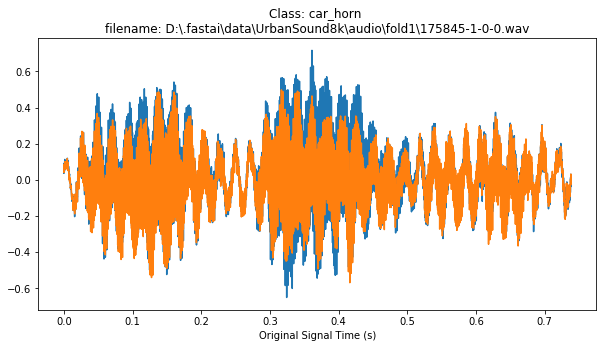

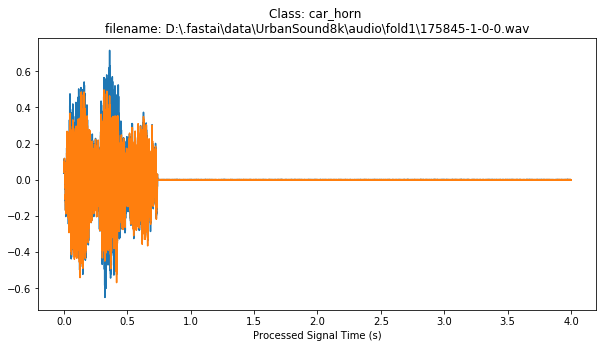

'Original signal'

'Processed signal'

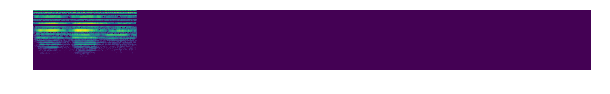

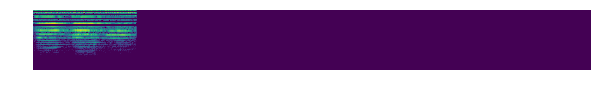

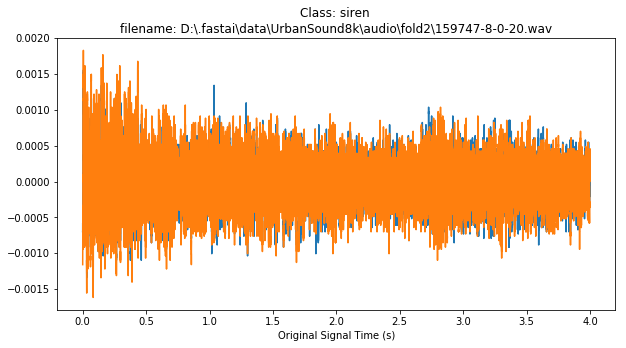

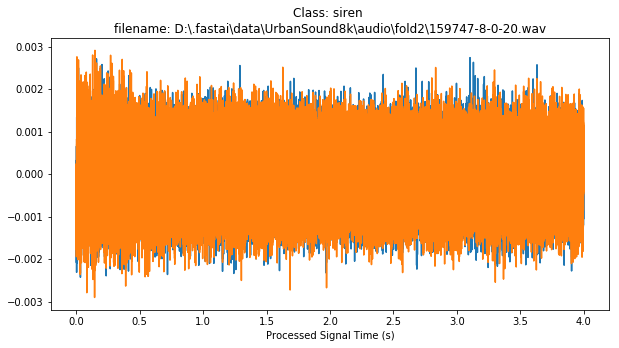

'Original signal'

'Processed signal'

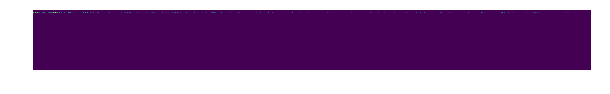

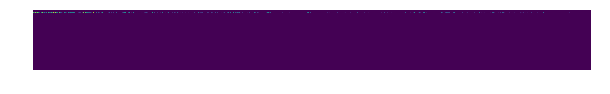

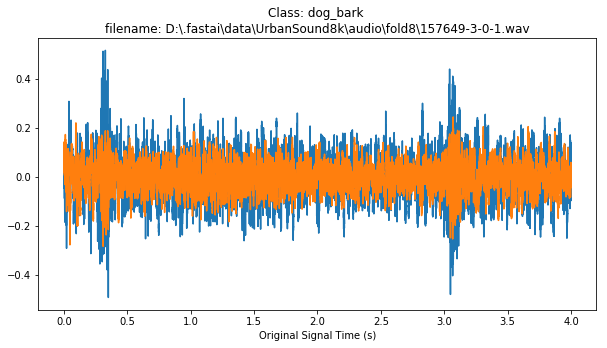

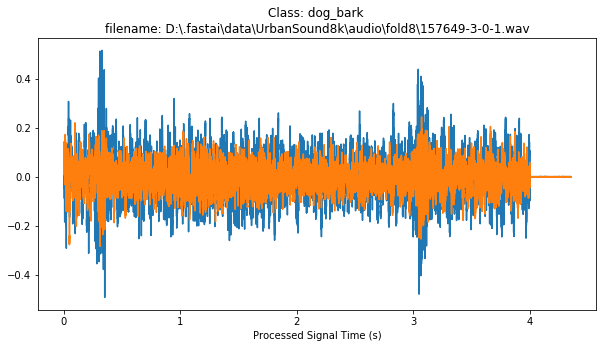

'Original signal'

'Processed signal'

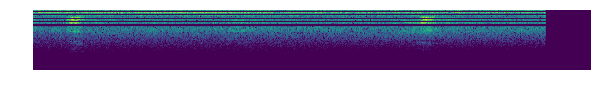

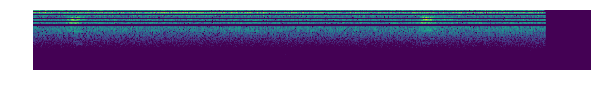

In [46]:
audios.show_batch(3, ds_type=DatasetType.Train, figsize=(10, 5))

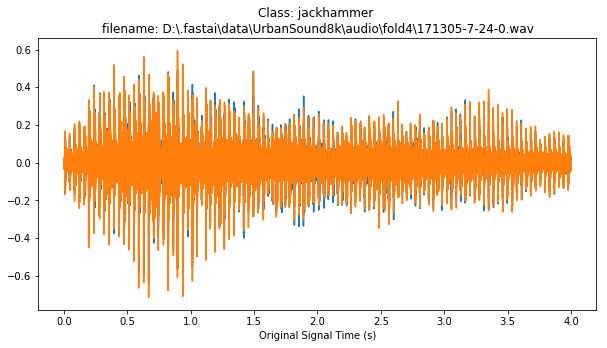

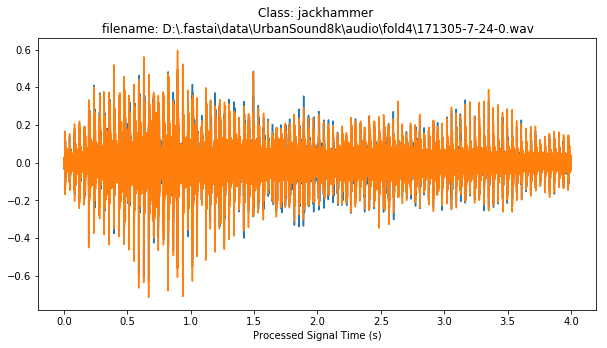

'Original signal'

'Processed signal'

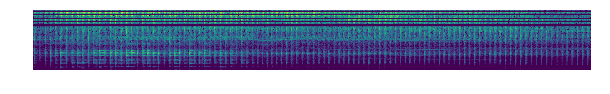

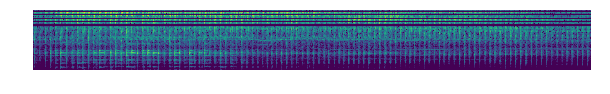

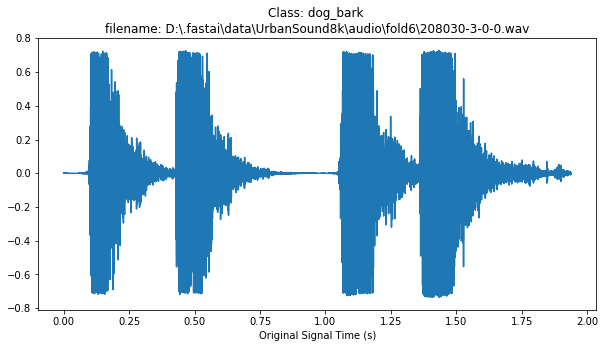

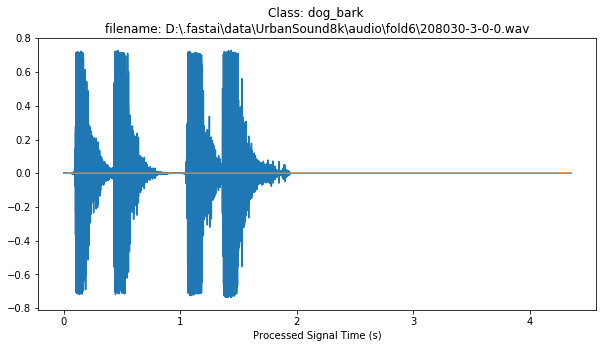

'Original signal'

'Processed signal'

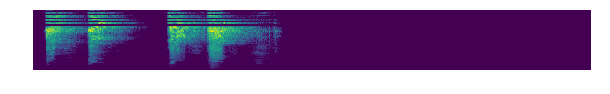

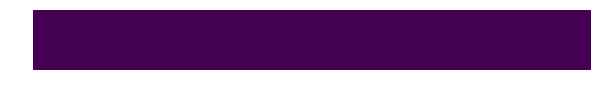

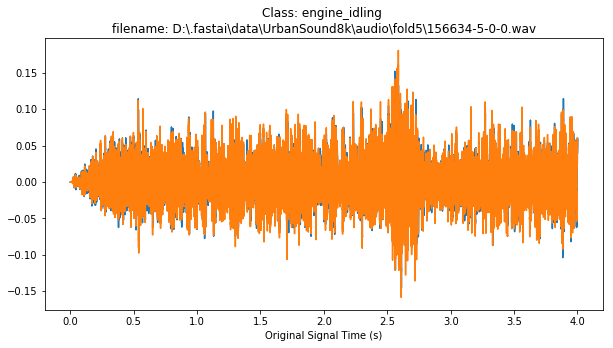

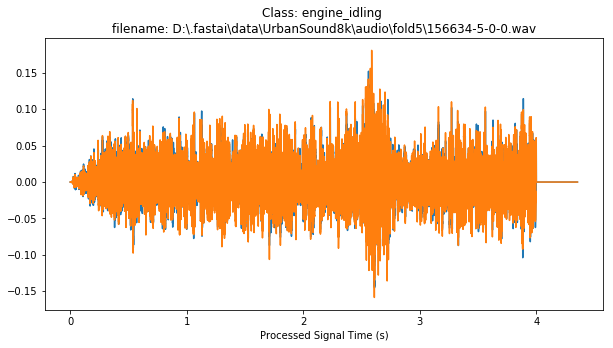

'Original signal'

'Processed signal'

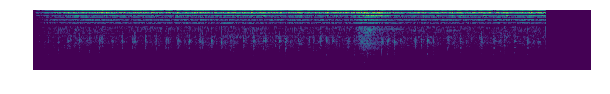

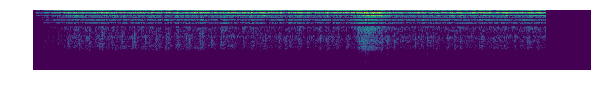

In [47]:
audios.show_batch(3, ds_type=DatasetType.Valid, figsize=(10, 5))

# Model

In [48]:
learn = create_cnn(audios, models.resnet18, metrics=accuracy, is_mono_input=False, pretrained=True)

In [49]:
#learn.model

# Training

In [50]:
%%time
learn.fit_one_cycle(4, max_lr=3e-3)

epoch,train_loss,valid_loss,accuracy,time
0,1.032118,0.674825,0.782360,03:03
1,0.575314,0.402634,0.864834,03:04
2,0.403168,0.262625,0.914089,02:55
3,0.273547,0.200682,0.932417,02:57


Wall time: 12min


In [51]:
learn.save("stage-1")

In [52]:
learn = learn.load("stage-1")

In [53]:
learn.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


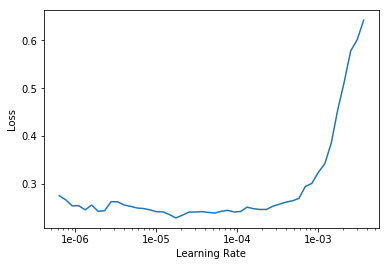

In [54]:
learn.lr_find()
learn.recorder.plot()

In [56]:
learn.fit_one_cycle(4, max_lr=slice(8e-5, 1e-5))

epoch,train_loss,valid_loss,accuracy,time
0,0.264744,0.216871,0.925544,03:02
1,0.182145,0.139355,0.953036,03:04
2,0.112423,0.110095,0.964490,02:59
3,0.059907,0.104555,0.961054,02:57


In [57]:
learn.save("stage-2")

In [58]:
learn = learn.load("stage-2")

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


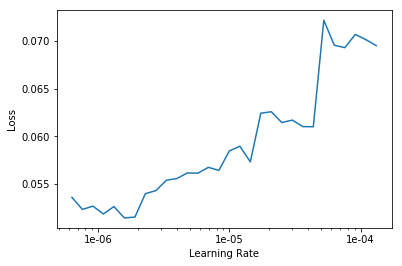

In [59]:
learn.lr_find()
learn.recorder.plot()

In [60]:
learn.fit_one_cycle(8, max_lr=slice(1e-7, 1e-6))

epoch,train_loss,valid_loss,accuracy,time
0,0.056691,0.105336,0.962199,02:57
1,0.064850,0.104778,0.962199,03:01
2,0.057955,0.102275,0.962199,02:51
3,0.062621,0.106695,0.962199,02:54
4,0.060721,0.100562,0.958763,02:50
5,0.059608,0.102754,0.964490,02:56
6,0.064855,0.102246,0.966781,02:51
7,0.060620,0.100948,0.963345,02:51


In [61]:
learn.save("stage-3")

In [62]:
learn = learn.load("stage-3")

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


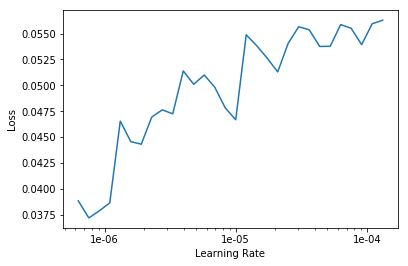

In [63]:
learn.lr_find()
learn.recorder.plot()

In [64]:
learn.fit_one_cycle(4, max_lr=slice(1e-8, 4e-6))

epoch,train_loss,valid_loss,accuracy,time
0,0.059641,0.098954,0.963345,02:55
1,0.050566,0.105103,0.963345,02:56
2,0.063768,0.101694,0.965636,02:55
3,0.052977,0.097581,0.959908,02:52


# Results & Interpretation

Using a transfer learning approach from ImageNet dataset to UrbanSound8k increase the training speed.
Note: One weakness of this work is the image input from spectogram is different in size vs ImageNet.

Best results: 96.7% accuracy

Benchmark 97%
https://www.kdd.org/kdd2018/files/deep-learning-day/DLDay18_paper_30.pdf

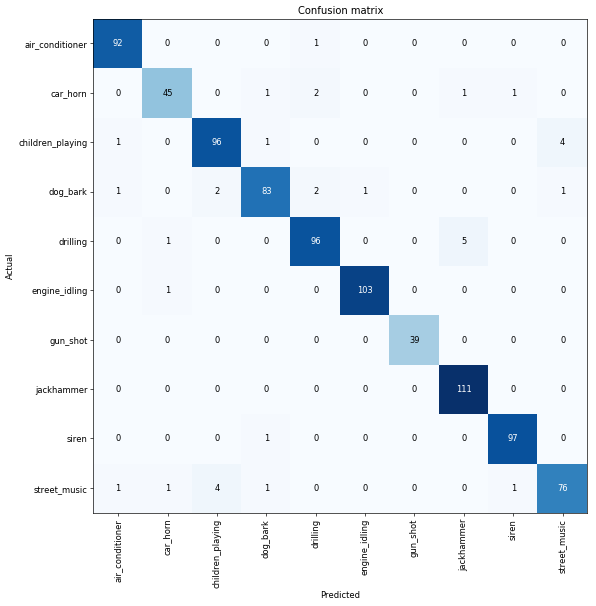

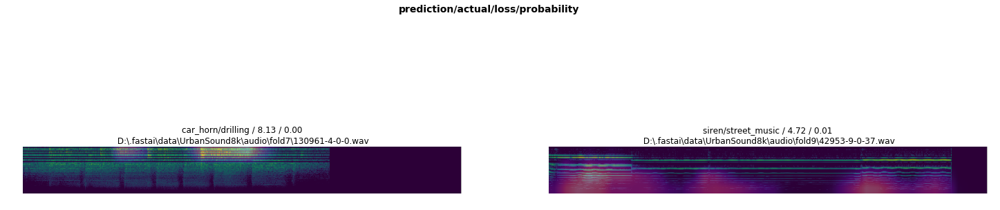

In [65]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(10, 10), dpi=60)
interp.plot_audio_top_losses(2)